# **ComfyUI를 활용한 stable diffusion 기반 이미지 생성 및 Lora 활용하기**

### colab에서 ComfyUI를 실행시킬수 있도록 구축
- 도움받은 사이트  
https://www.youtube.com/watch?v=By7aAos-sV8  
https://www.youtube.com/watch?v=sTK-ra7TzpA  
https://www.youtube.com/watch?v=OZ7j1101jhg  
https://www.youtube.com/watch?v=Hj0hTaaeeqo&list=PL7JmxIZZo0xQGyqaDnZTYI9OQJ4gjFJVS&index=36  
https://www.youtube.com/watch?v=HUY2WdbNQmc&t=373s  

### wokrflow 구조
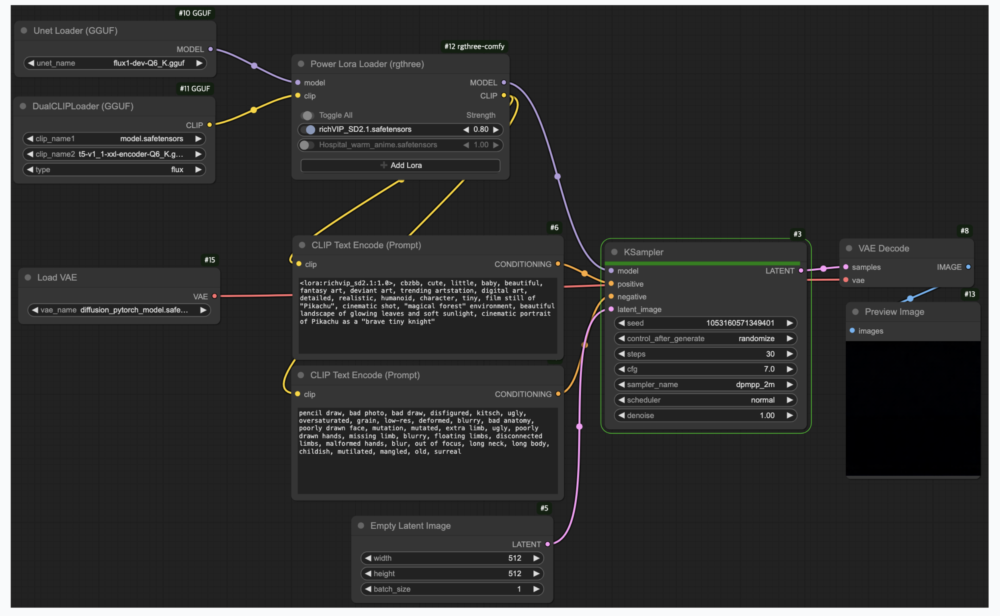
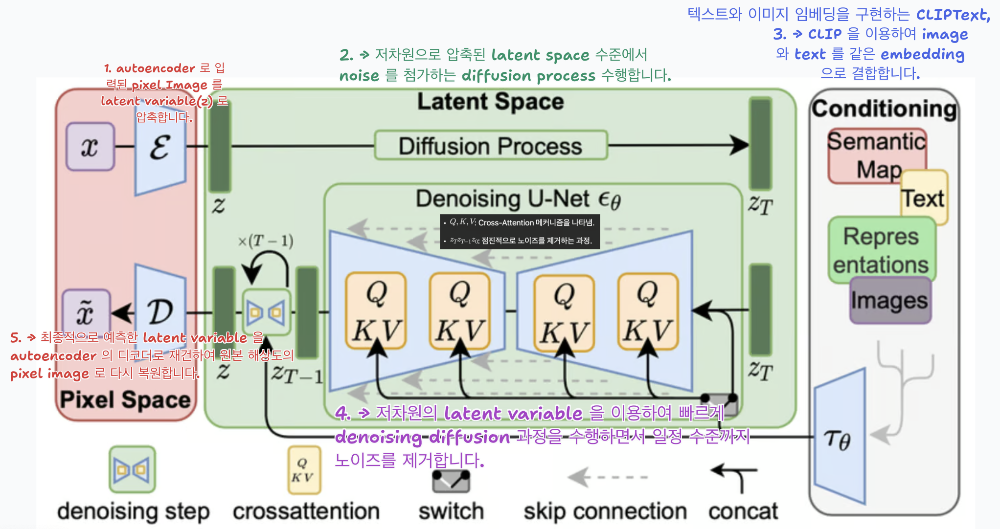
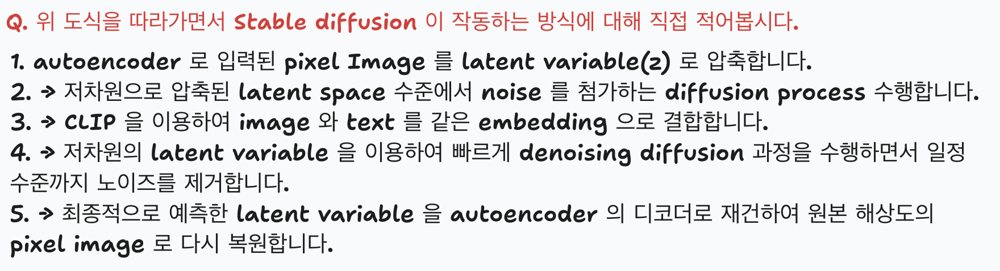

### GGUF란?  
- 참조: https://tilnote.io/pages/66cac6d0af1501fb363b9078  
ㅁ 요약  
GGUF 포맷은 Georgi Gerganov(@ggerganov)라는 개발자가 만든 딥러닝 모델 저장용 단일 파일 포맷입니다. 이 포맷은 주로 LLM(Large Language Model) 추론에 활용되며, 다음과 같은 특징을 가지고 있습니다:
    - **GGUF 포맷은 Georgi Gerganov에 의해 개발된 딥러닝 모델 저장용 단일 파일 포맷입니다.**
    - **이 포맷은 메타데이터와 텐서 데이터를 저장하며, 다양한 양자화를 지원하여 모델의 크기를 줄이고 추론 속도를 높입니다.**
    - **GGUF는 주로 GGML 라이브러리 기반 런타임에서 사용되며, CPU에서도 실행 가능하여 큰 유연성과 확장성을 제공합니다.**
    
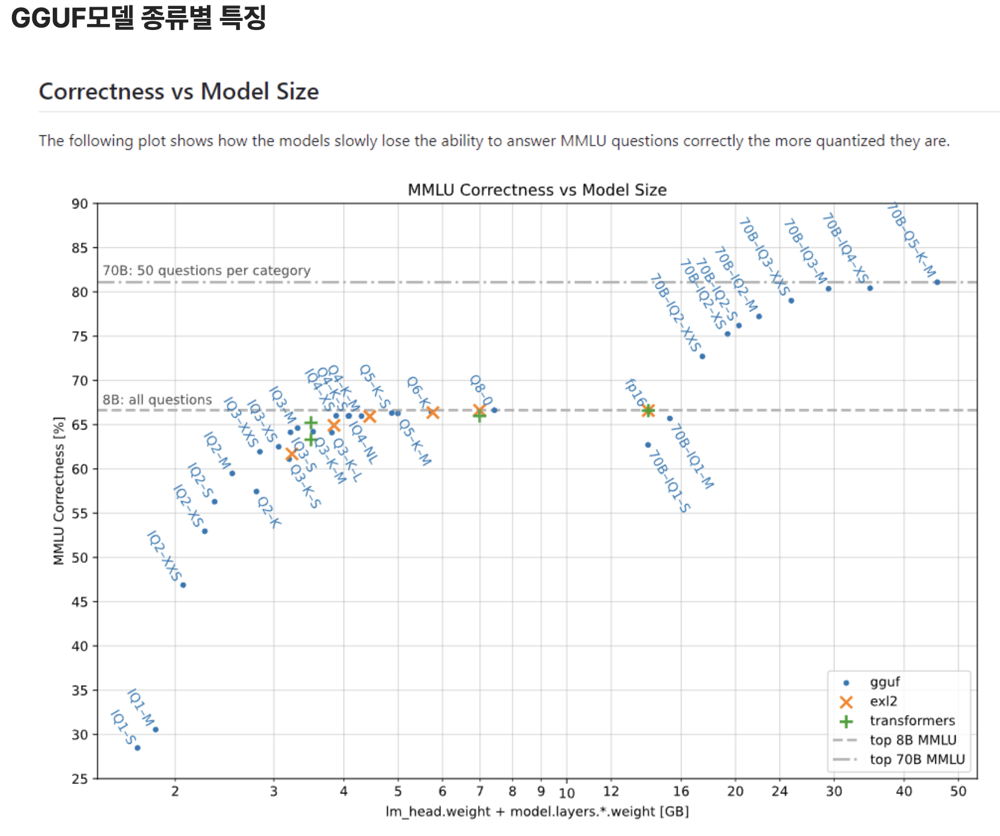
- Q8_0: 8비트 양자화 모델로, 원본 모델의 품질을 거의 그대로 유지하면서 크기를 절반으로 줄입니다.  

- Q6_K, Q5_K_M, Q5_K_S: 6비트와 5비트 양자화 모델들로, 품질 손실은 미미하지만 크기가 더 작습니다.  


=> 위를 참조하여, GGUF Unet load와 DualCLiploader, Lora를 활용하여 이미지 생성을 구현

## 1. comfyUI 사용해보기

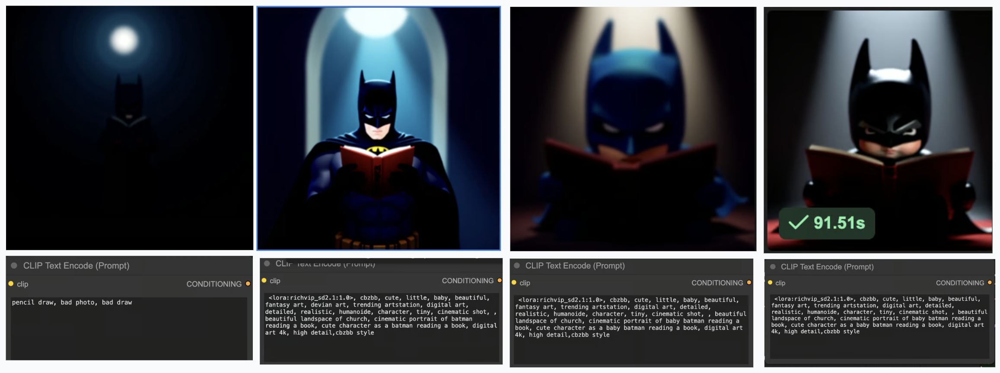
- Postive prompt만을 변경 (이외 조건은 모두 동일)
- 프롬프트의 영향을 크게 받는다는 것을 확인 가능 (원하는 목적에 맞게 이미지가 생성된다는 것이 확인됨)
- 3번째 이미지부터 batman앞에 baby라는 프롬프트를 추가하여 아기배트맨 이미지가 생성됨을 확인

## 2. 실험 - 노드안의 변수들을 조정하여 생성된 이미지 비교 실험
    -1. KSampler의 Guidance Scale” 또는 “CFG (Classifier-Free Guidance) Scale(3, 7, 10)
    -2. KSampler의 Step(5, 30, 50)
    -3. KSampler의 Sampler 변경(Euler, Dpmpp_2m, 
    -4. KSampler의 Seed, control after generate(Fixed, increment, decrement, randomize)
    -5. KSampler의 denoise(0.3, 1.0, 2.0)
    -6. Lora strength(0.3, 0.8, 1.0)

- 통제 변인, 실험 환경
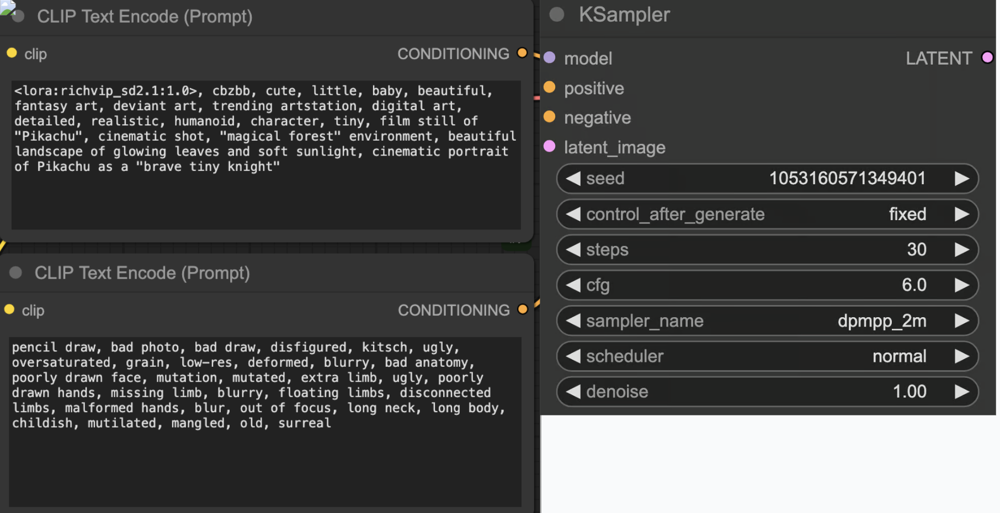
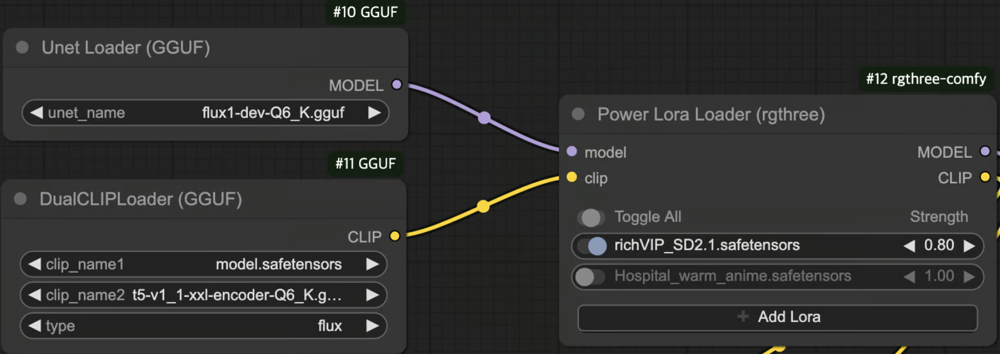



###     -1. KSampler의 Guidance Scale” 또는 “CFG (Classifier-Free Guidance) Scale(3, 7, 10)


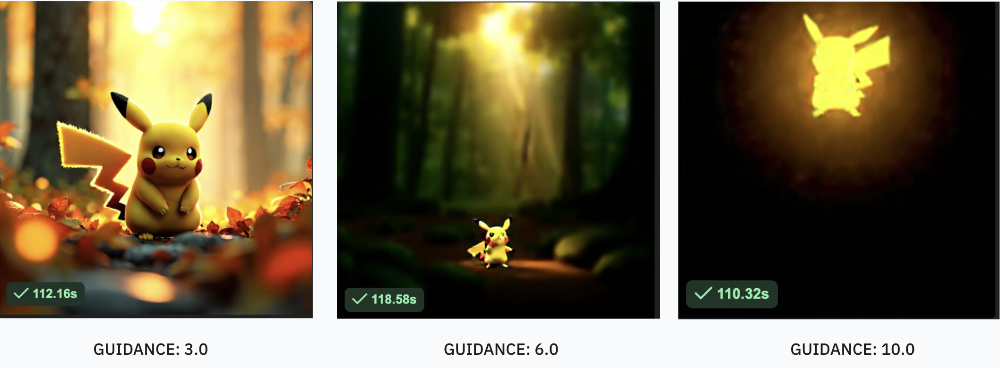

    - “Guidance Scale” 또는 “CFG (Classifier-Free Guidance) Scale”로 알려져 있으며, 
      텍스트 프롬프트에 얼마나 강하게 맞춰 이미지를 생성할지 결정
      •  값이 높을수록: 프롬프트에 강하게 맞춰 이미지를 생성하지만, 너무 높으면 왜곡이 생길 수 있다.
      •  값이 낮을수록: 모델의 자유로운 해석이 많아져, 결과물이 덜 프롬프트에 집중될 수 있다.
=> 프롬프트 중 'littel, baby' 등의 단어를 넣었는데 CGF scale이 올라갈수록 피카츄가 확실히 작아지고, 아기같은 형상을 띄게 됨을 확인할 수 있었다.  
=> 반면, CFG 10.0의 이미지는 오히려 프롬프트에 강하게 맞추려고 하는 경향이 이미지의 왜곡을 더 크게 불러옴을 확인하였다.

### -2. KSampler의 Step(5, 30, 50)

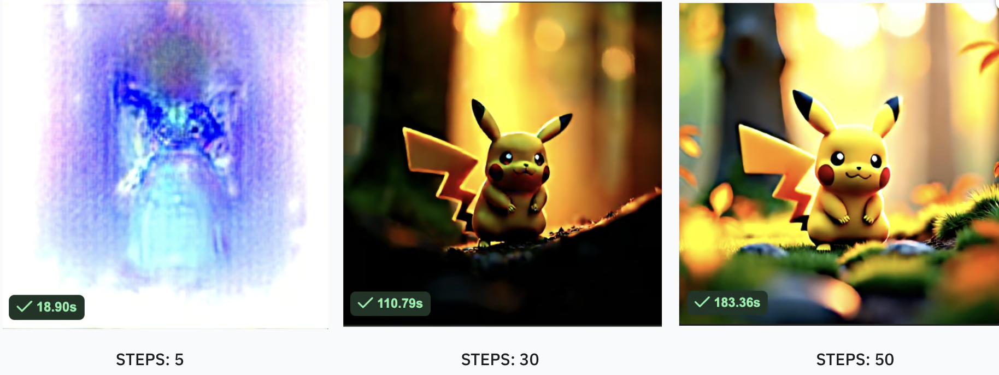

    - 노이즈로부터 이미지를 생성할때, 지정된 step만큼 반복적으로 계산을 수행, interpolating과 연관되며 step이 많을수록 품질과 세밀함이 증가
      •  값이 높을수록: 이미지 품질이 좋아질 수 있지만, 생성 시간이 길어집니다. 너무 높으면 개선 효과가 줄어든다.
      •  값이 낮을수록: 생성 속도가 매우 빠르지만, 디테일 부족 및 노이즈 잔존 가능.
=> step이 현저히 낮을 시, 이미지 생성속도는 18.9s로 매우 빠르게 생성되지만 노이즈가 잔존 및 원하는 프롬프트에 맞는 이미지가 전혀 생성되지 않음을 확인하였다.  ㅇ
=> 기본적으로 step수를 30으로 설정하였던 이미지보다, step을 50으로 설정하여 생성된 이미지가, 품질면에서 더 뚜렷하고 개선된 해상도로 이미지가 생성됨. 그만큼 생성되는 시간은 183s로 길어짐을 확인하였다.

### -3. KSampler의 Sampler 변경(Euler, Dpmpp_2m, DPM++ 3M SDE)

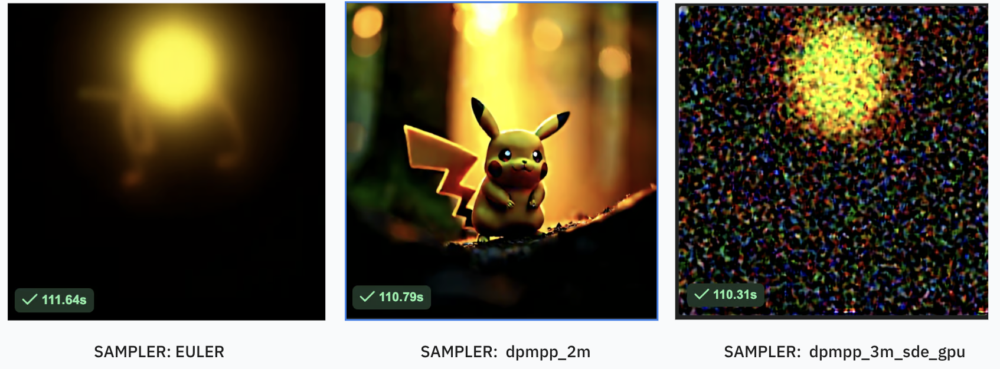

    - 1. Euler a
	• 빠르고 안정적입니다.
	• Steps 수가 적어도 결과물이 상대적으로 선명하고 일관성 있게 생성됩니다.
	• 디퓨전 과정에서 중간 상태(interpolated states)를 효과적으로 계산하지만, 복잡한 디테일을 처리하는 데 한계가 있을 수 있습니다.
    
    - 2. DPM++ 2M
    • 높은 Steps에서 디테일을 극대화하며, 디퓨전 과정의 중간 단계를 정교하게 처리합니다.
	• 부드럽고 선명한 결과를 제공하며, 복잡한 디테일과 조명을 효과적으로 처리할 수 있습니다.
	• 많은 Stable Diffusion 사용자들이 “디폴트로 사용”할 만큼 신뢰성이 높은 샘플러입니다.
    
    - 3.DPM++ 3M SDE (Stochastic Differential Equations)
    • SDE 기반 샘플러는 더 높은 해상도와 복잡한 이미지 생성에 적합합니다.
	• 매우 많은 Steps를 요구하며, 낮은 Steps에서는 제대로 작동하지 않거나 노이즈가 남을 가능성이 높습니다.
	• 계산 비용이 크고, 특정 상황에서는 노이즈만 생성될 수 있습니다.
    
=> DPM++ 2M이 지정된 step(30)과 cfg(6.0)에서 가장 좋은 품질의 이미지를 생성함을 확인하였다. Euler는 step을 좀더 늘려보면 이미지가 개선될 여지가 있음. DPM++ 3M은 최소 step을 50~100이상으로 설정하여 실험을 해보면 좋을것 같다.


### -4. KSampler의 Seed, control after generate (Fixed, increment, decrement, randomize)


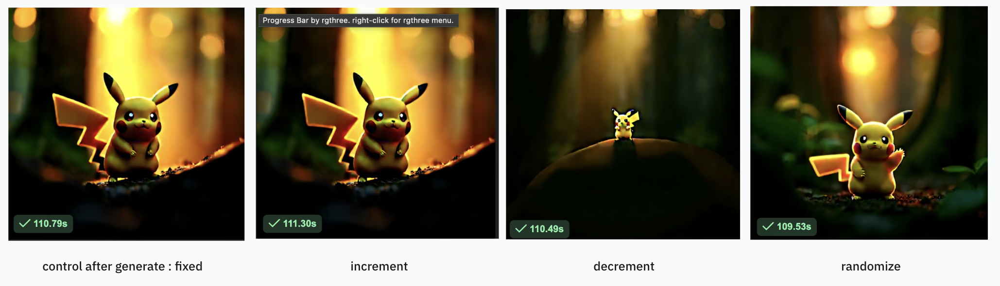

    - Seed 값이 이미지 생성 후 어떻게 조정될지를 결정
      • Fixed: Seed가 고정되어, 여러 번 실행해도 같은 Seed를 사용.
      • Increment: 이전 Seed 값에 1을 더해 새로운 Seed로 설정.
      • Randomize: 매 실행 시 Seed가 무작위로 설정.
=> Fixed 설정으로 동일한 결과가 생성됨을 확인하였고, increment는 fixed이미지와 큰 차이가 없음  
=> decrement 및 randomize는 이미지 생성결과에 큰 차이가 보임

### 추가실험 계획

### -5. KSampler의 denoise(0.3, 1.0, 2.0)


### -6. Lora strength(0.3, 0.8, 1.0)

## 회고
- stabel diffusion을 활용하여 원하는 이미지를 프롬프트에 맞게끔 만들 수 있는것에 신기함과 재미를 느꼈다.
- 실제 위 stable diffusion을 구현하는 코드는 살펴보지 못했기에, 각 노드들이 어떻게 코드로 구현되어있는지를 살펴보면 좋을 것 같다.
- 남은 추가실험을 통해 모델에 대한 이해를 높여야겠다.